In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from numba import njit

# Завдання 1

## Згенеруйте двовимірні дані (xx, yy) за допомогою numpy.random : бажано, щоб розподіл точок був навколо деякої наперед заданої прямої (yy = kk + bb) для подальшого аналізу результатів.

In [8]:
# Задана пряма y = k * x + b
k = 2
b = 5

np.random.seed(42) 
x = np.linspace(0, 10, 100000)
y = k * x + b + np.random.normal(0, 10, size=len(x))

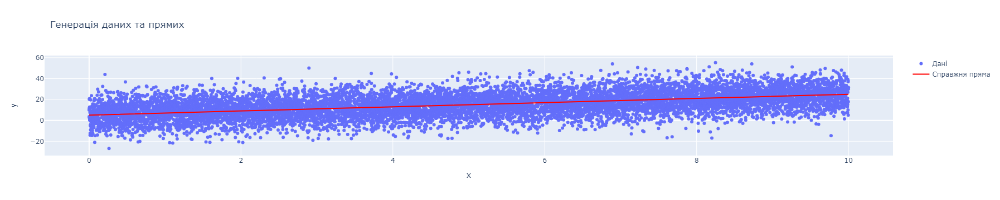

In [9]:
# Відображення данних
fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y=y, mode='markers', name='Дані'))

# Справжня пряма
fig.add_trace(go.Scatter(x=x, y=k * x + b, mode='lines', line=dict(color='red'), name='Справжня пряма'))

fig.update_layout(title='Генерація даних та прямих',
                  xaxis=dict(title='x'),
                  yaxis=dict(title='y'))

# Відображення графіка
fig.show()

## Напишіть функцію, яка реалізує метод найменших квадратів для пошуку оптимальних оцінок k_lsq та b_lsq.

In [12]:
@njit
def least_squares(x, y):
    x_mean, y_mean = np.mean(x), np.mean(y)

    numerator = np.sum((x - x_mean) * (y - y_mean))
    denominator = np.sum((x - x_mean)**2)

    k = numerator / denominator
    b = y_mean - k * x_mean

    return k, b

In [13]:
k_lsq, b_lsq = least_squares(x, y)
k_lsq, b_lsq

(1.9656358459532257, 5.150460936549562)

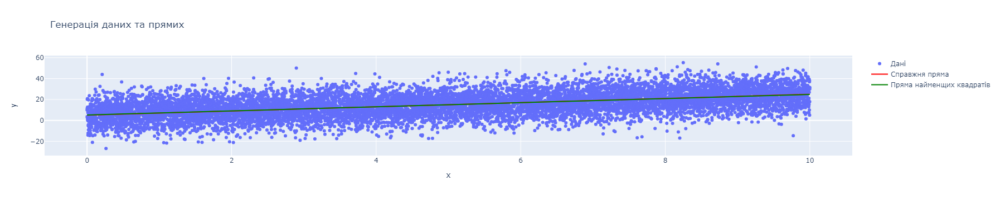

In [14]:
fig.add_trace(go.Scatter(x=x, y=k_lsq * x + b_lsq, mode='lines', line=dict(color='green'), name='Пряма найменщих квадратів'))

## Порівняйте знайдені параметри з оцінкою np.polyfit(x,y,1) (оцінка полінома степеню 1 методом найменших квадратів), та з початковими параметрами прямої (якщо такі є).

In [16]:
# Знайдення параметрів за допомогою np.polyfit
coefficients_np = np.polyfit(x, y, 1)
k_np, b_np = coefficients_np

In [26]:
# Порівняння з початковими параметрами прямої
print("Початкові параметри прямої:")
print(f"k_true = {k}, b_true = {b}")

# Виведення результатів
print("\nОцінки параметрів за допомогою least_squares:")
print(f"k_ls = {k_lsq}, b_ls = {b_lsq}")

print("\nОцінки параметрів за допомогою np.polyfit:")
print(f"k_np = {k_np}, b_np = {b_np}")

Початкові параметри прямої:
k_true = 1.9656358459532233, b_true = 5.150460936549611

Оцінки параметрів за допомогою least_squares:
k_ls = 1.9656358459532257, b_ls = 5.150460936549562

Оцінки параметрів за допомогою np.polyfit:
k_np = 1.965635845953217, b_np = 5.15046093654966


In [29]:
percent_error_k_ls = abs((k_lsq - k) / k) * 100
percent_error_k_np = abs((k_np - k) / k) * 100

percent_error_b_ls = abs((b_lsq - b) / b) * 100
percent_error_b_np = abs((b_np - b) / b) * 100

print(percent_error_k_ls)
print(percent_error_k_np)
print(percent_error_b_ls)
print(percent_error_b_np)

1.2425957021509612e-13
3.162970878202447e-13
9.484551710090686e-13
9.484551710090686e-13


## Відобразіть на графіку знайдені оцінки лінії регресії (вашої та numpy). Якщо ви генерували вхідні дані навколо лінії, відобразіть також її.

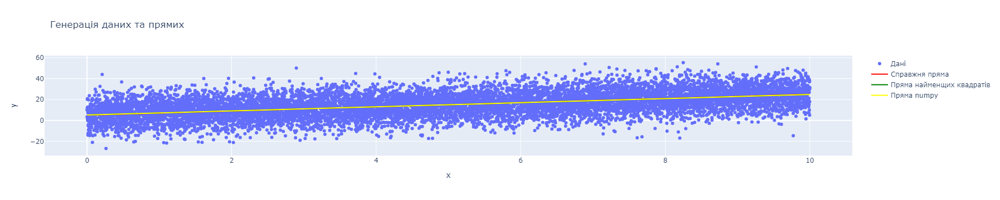

In [18]:
fig.add_trace(go.Scatter(x=x, y=k_np * x + b_np, mode='lines', line=dict(color='yellow'), name='Пряма numpy'))

# Завдання 2

### 1. Напишіть функцію, яка реалізує метод градієнтного спуску для пошуку оптимальних оцінок kk� та bb�. Визначіть оптимальні вхідні параметри: learning_rate, n_iter

In [19]:
def gradient_descent(x, y, learning_rate, n_iter):
    k, b = 0, 0
    m = len(x)
    errors = []

    for _ in range(n_iter):
        # Обчислення градієнтів
        gradient_k = (-2/m) * np.sum(x * (y - (k*x + b)))
        gradient_b = (-2/m) * np.sum(y - (k*x + b))

        # Оновлення параметрів за допомогою градієнтного спуску
        k -= learning_rate * gradient_k
        b -= learning_rate * gradient_b

        # Обчислення функції втрат MSE
        error = np.mean((y - (k*x + b))**2)
        errors.append(error)

    return k, b, errors

In [20]:
# Оптимальні параметри для градієнтного спуску
learning_rate = 0.01
n_iter = 10000

# Знайдення оптимальних параметрів за допомогою градієнтного спуску
k_gd, b_gd, errors = gradient_descent(x, y, learning_rate, n_iter)

In [21]:
k_gd, b_gd

(1.9656358459532304, 5.150460936549564)

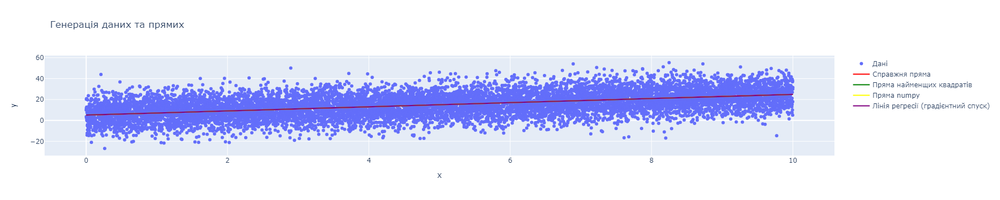

In [22]:
# Відобразіть дані та лінію регресії
#fig = go.Figure()

# Дані
#fig.add_trace(go.Scatter(x=x, y=y, mode='markers', name='Дані'))

# Лінія регресії (градієнтний спуск)
fig.add_trace(go.Scatter(x=x, y=k_gd*x + b_gd, mode='lines', line=dict(color='purple'), name='Лінія регресії (градієнтний спуск)'))

# Налаштування графіка
#fig.update_layout(xaxis_title='x', yaxis_title='y', title='Лінія регресії за допомогою градієнтного спуску')

# Відображення графіка
fig.show()

# 3. **Графік похибки від кількості ітерацій:**

## Побудуйте графік похибки від кількості ітерацій

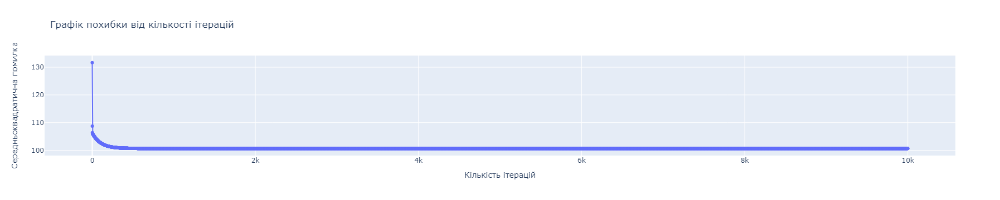

In [23]:
fig_errors = go.Figure()
fig_errors.add_trace(go.Scatter(x=np.arange(len(errors)), y=errors, mode='lines+markers', name='Похибка'))
fig_errors.update_layout(xaxis_title='Кількість ітерацій', yaxis_title='Середньоквадратична помилка', title='Графік похибки від кількості ітерацій')
fig_errors.show()

In [24]:
# Оптимізація градієнтного спуску
learning_rates = [0.001, 0.01, 0.02]
n_iters = [100, 500, 1000, 2000, 5000, 10000, 20000, 30000]

best_params = None
best_error = float('inf')

for lr in learning_rates:
    for n_iter in n_iters:
        k, b, errors = gradient_descent(x, y, lr, n_iter)
        final_error = errors[-1]
        print(f' {lr} {n_iter} {final_error}')

        if final_error < best_error:
            best_error = final_error
            best_params = (lr, n_iter, k, b)

# Виведення результатів
print("Найкращі параметри:")
print(f"Learning Rate: {best_params[0]}")
print(f"Number of Iterations: {best_params[1]}")
print(f"Optimal k: {best_params[2]}")
print(f"Optimal b: {best_params[3]}")

 0.001 100 105.7800064206474
 0.001 500 104.12639963464058
 0.001 1000 102.79081818009247
 0.001 2000 101.46972941760137
 0.001 5000 100.71606691251905
 0.001 10000 100.67408061116188
 0.001 20000 100.67376279828831
 0.001 30000 100.67376278034932
 0.01 100 102.78625076439793
 0.01 500 100.71561253463344
 0.01 1000 100.67407382034871
 0.01 2000 100.67376279752988
 0.01 5000 100.6737627803483
 0.01 10000 100.6737627803483
 0.01 20000 100.6737627803483
 0.01 30000 100.6737627803483
 0.02 100 101.46248034315548
 0.02 500 100.67406639954982
 0.02 1000 100.67376279671981
 0.02 2000 100.6737627803483
 0.02 5000 100.6737627803483
 0.02 10000 100.6737627803483
 0.02 20000 100.6737627803483
 0.02 30000 100.6737627803483
Найкращі параметри:
Learning Rate: 0.01
Number of Iterations: 5000
Optimal k: 1.9656358459694772
Optimal b: 5.15046093644204
